In [79]:
import netCDF4
from pathlib import Path

#patch = netCDF4.Dataset(Path('data/2020_31TCG_patch_14_14.nc'), 'r')
patch = netCDF4.Dataset(Path('dataset/netcdf/2019_31TBF_patch_17_13.nc'), 'r')
patch

<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF4 data model, file format HDF5):
    title: S4A Patch Dataset
    authors: Papoutsis I., Sykas D., Zografakis D., Sdraka M.
    patch_full_name: 2019_31TBF_patch_17_13
    patch_year: 2019
    patch_name: patch_17_13
    patch_country_code: ES
    patch_tile: 31TBF
    creation_date: 27 Apr 2021
    references: Documentation available at .
    institution: National Observatory of Athens.
    version: 21.03
    _format: NETCDF4
    _nco_version: netCDF Operators version 4.9.1 (Homepage = http://nco.sf.net, Code = http://github.com/nco/nco)
    _xarray_version: 0.17.0
    dimensions(sizes): 
    variables(dimensions): 
    groups: B01, B02, B03, B04, B05, B06, B07, B08, B09, B10, B11, B12, B8A, labels, parcels

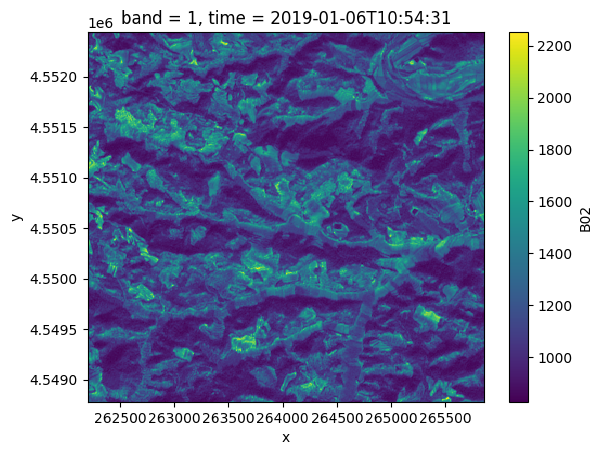

In [186]:
import xarray as xr

band_data = xr.open_dataset(xr.backends.NetCDF4DataStore(patch['B02']))
band_data.B02.isel(time=0).plot()

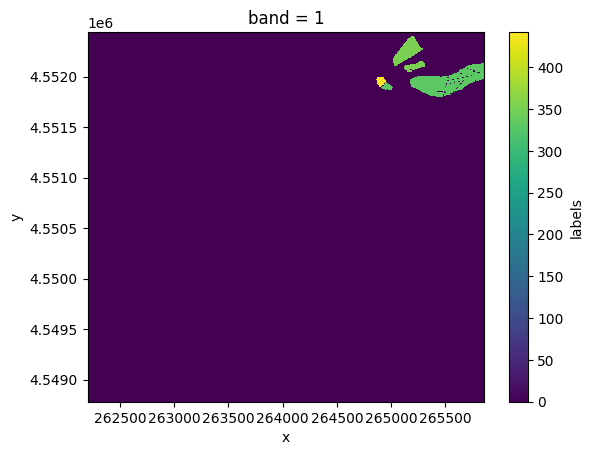

In [187]:
labels = xr.open_dataset(xr.backends.NetCDF4DataStore(patch['labels']))
labels.labels.plot()

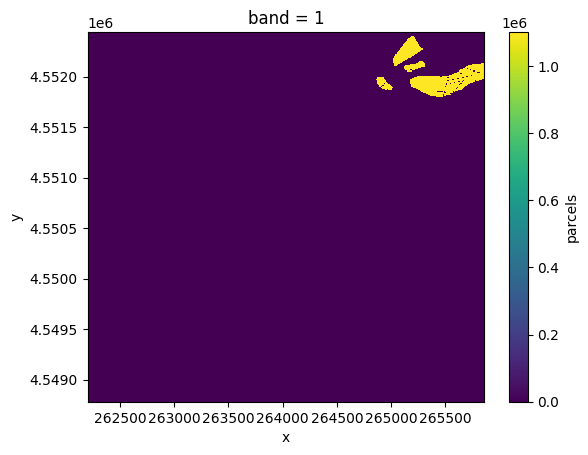

In [188]:
parcels = xr.open_dataset(xr.backends.NetCDF4DataStore(patch['parcels']))
parcels.parcels.plot()

In [189]:
parcels.parcels[0,0]

<xarray.DataArray 'parcels' ()> Size: 4B
[1 values with dtype=uint32]
Coordinates:
    band     int64 8B ...
    y        float64 8B 4.552e+06
    x        float64 8B 2.622e+05
Attributes:
    transform:      [ 1.00000e+01  0.00000e+00  2.62200e+05  0.00000e+00 -1.0...
    crs:            +init=epsg:32631
    res:            [10. 10.]
    is_tiled:       0
    nodatavals:     nan
    scales:         1.0
    offsets:        0.0
    AREA_OR_POINT:  Area

In [190]:
import pandas as pd
# Or maybe aggregate based on a given frequency
# Refer to
# https://pandas.pydata.org/pandas-docs/stable/user_guide/timeseries.html#timeseries-offset-aliases
group_freq = '1MS'

# Grab year from netcdf4's global attribute
year = patch.patch_year

# output intervals
date_range = pd.date_range(start=f'{year}-01-01', end=f'{int(year) + 1}-01-01', freq=group_freq)

# Aggregate based on given frequency
band_data = band_data.groupby_bins(
    'time',
    bins=date_range,
    right=True,
    include_lowest=False,
    labels=date_range[:-1]
).median(dim='time')

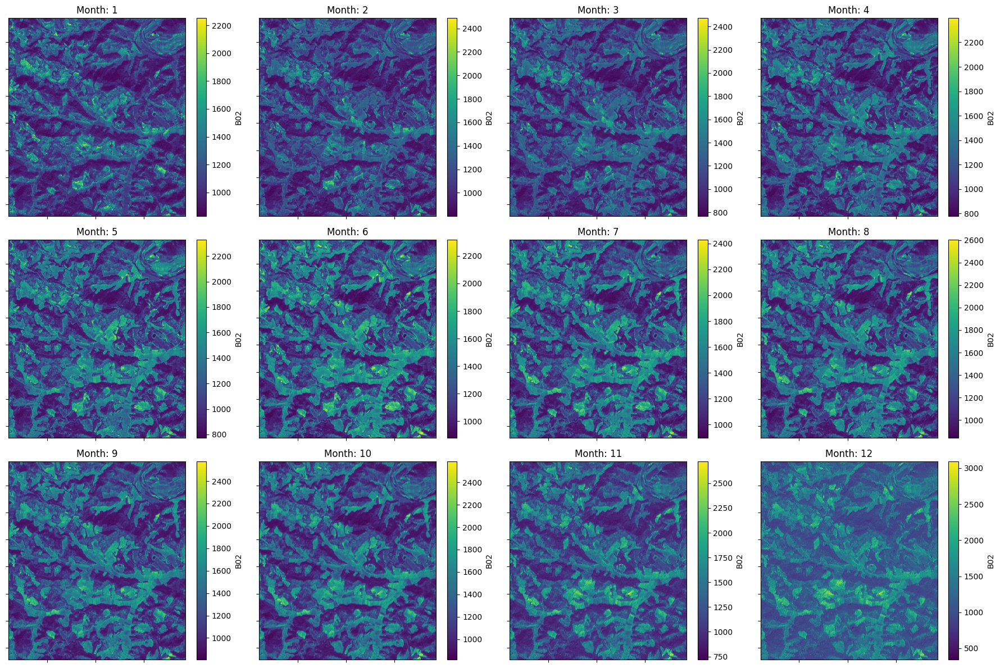

In [191]:
import matplotlib.pyplot as plt

band_data = band_data.interpolate_na(dim='time_bins', method='linear', fill_value='extrapolate')

fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(18, 12))

for i, season in enumerate(band_data.B02):

    ax = axes.flat[i]
    cax = band_data.B02.isel(time_bins=i).plot(ax=ax)


for i, ax in enumerate(axes.flat):
    ax.axes.get_xaxis().set_ticklabels([])
    ax.axes.get_yaxis().set_ticklabels([])
    ax.axes.axis('tight')
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_title(f'Month: {i+1}')


plt.tight_layout()
plt.show()

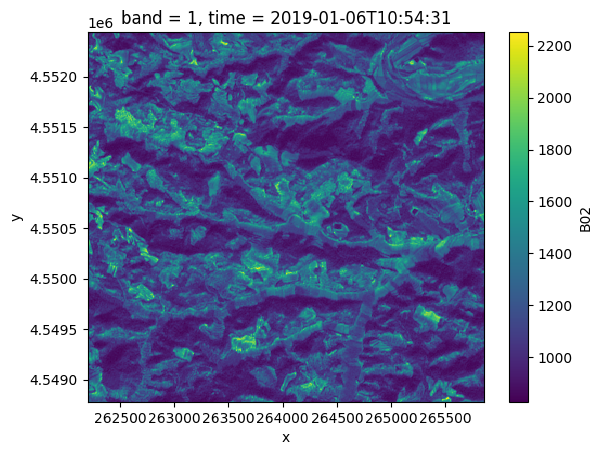

In [192]:
band_data_B02 = xr.open_dataset(xr.backends.NetCDF4DataStore(patch['B02']))
band_data_B02.B02.isel(time=0).plot()

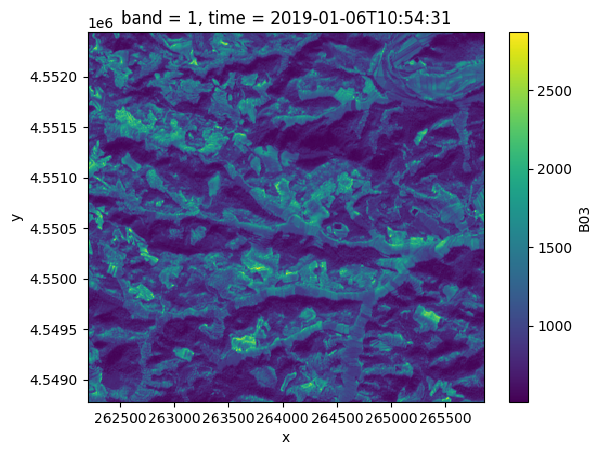

In [193]:
band_data_B03 = xr.open_dataset(xr.backends.NetCDF4DataStore(patch['B03']))
band_data_B03.B03.isel(time=0).plot()

In [174]:
fB03 = band_data_B03.B03.isel(time=0)
print(type(fB03), fB03.shape, fB03.dtype)

<class 'xarray.core.dataarray.DataArray'> (366, 366) uint16


In [175]:
fB03[0:2,0:3]

<xarray.DataArray 'B03' (y: 2, x: 3)> Size: 12B
[6 values with dtype=uint16]
Coordinates:
    band     int64 8B ...
  * y        (y) float64 16B 4.552e+06 4.552e+06
  * x        (x) float64 24B 2.622e+05 2.622e+05 2.622e+05
    time     datetime64[ns] 8B 2019-01-06T10:54:31
Attributes:
    transform:      [ 1.00000e+01  0.00000e+00  2.62200e+05  0.00000e+00 -1.0...
    crs:            +init=epsg:32631
    res:            [10. 10.]
    is_tiled:       0
    nodatavals:     nan
    scales:         1.0
    offsets:        0.0
    AREA_OR_POINT:  Area

In [176]:
import numpy as np

## Attempt to combine Blue, Green, and Red channels into an RGB image

In [177]:
band_B02 = xr.open_dataset(xr.backends.NetCDF4DataStore(patch['B02'])).B02.isel(time=0)
band_B03 = xr.open_dataset(xr.backends.NetCDF4DataStore(patch['B03'])).B03.isel(time=0)
band_B04 = xr.open_dataset(xr.backends.NetCDF4DataStore(patch['B04'])).B04.isel(time=0)

print(f'max: B02: {np.max(np.array(band_B02))}, B03: {np.max(np.array(band_B03))}, B04: {np.max(np.array(band_B04))}')

max: B02: 2252, B03: 2869, B04: 3827


### dtype is 16 bits.  It appears that the upper 4 are not used

Shift right 4 and convert to uint8 for RGB display

In [178]:
fBlue = np.array((band_B02 / 8).astype(np.uint8))
fGreen = np.array((band_B03 / 8).astype(np.uint8))
fRed = np.array((band_B04 / 8).astype(np.uint8))

### Show a single channel as grayscale

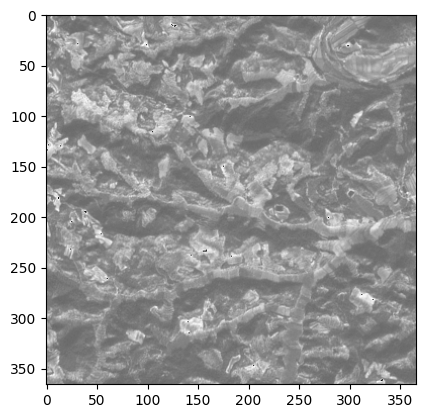

In [179]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.imshow(fBlue, cmap='gray')

### Combined and display channels

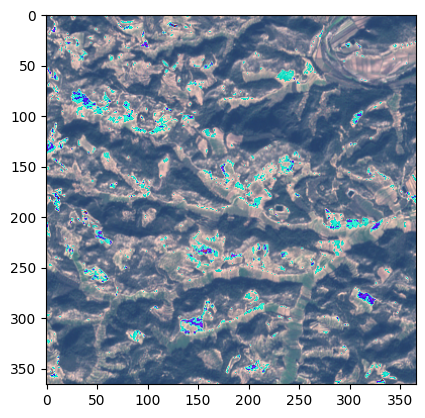

In [180]:
rgb = np.zeros((fBlue.shape[0], fBlue.shape[1],3), 'uint8')
rgb[:, :, 0] = fRed
rgb[:, :, 1] = fGreen
rgb[:, :, 2] = fBlue
plt.imshow(rgb)
#plt.imshow(fRed, cmap='gray')

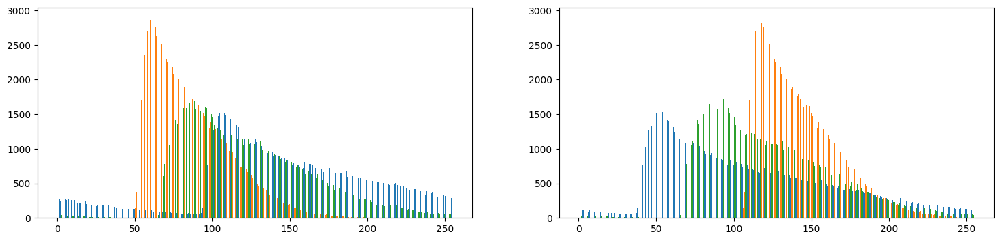

In [182]:
rgb2 = np.dstack((fRed, fGreen, fBlue))
rgb2.shape
from PIL import Image

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(18, 4))
#ax0 = axes[0].hist([fRed.flatten()], bins=256)
ax0 = axes[0].hist([(fRed-200).flatten(), (fBlue+200).flatten(), fGreen.flatten()], bins=256)

from mpl_toolkits.axes_grid1 import axes_grid
ax1 = axes[1].hist([fRed.flatten(), fBlue.flatten(), fGreen.flatten()], bins=256)


## A Visualization of the various 10m Channel Views: Red, Green, Blue, and NIR

['B02 - Blue', 'B03 - Green', 'B04 - Red', 'B08 - NIR']
(366, 366), float64
xlim: 0 - 3827


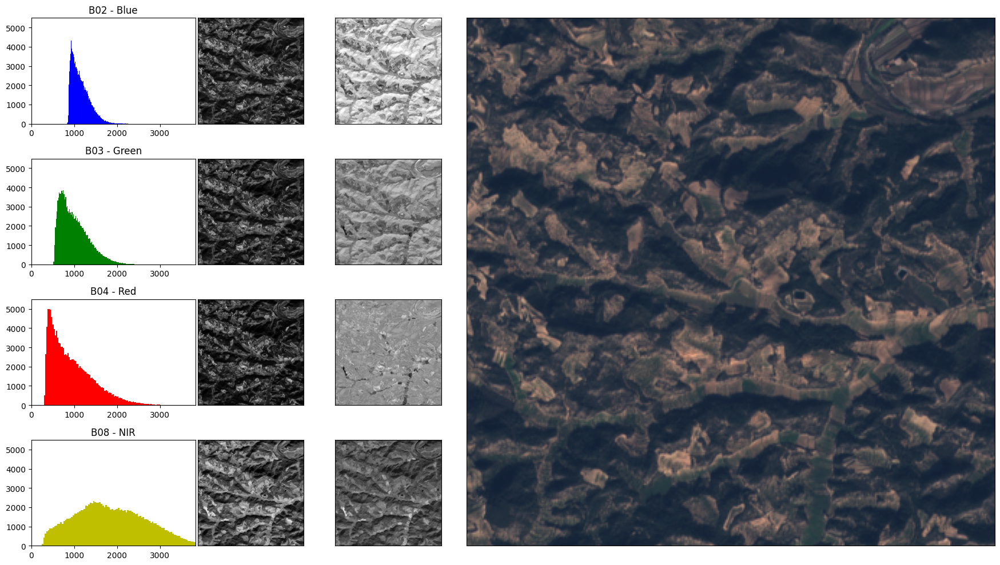

In [368]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
import numpy as np

B02 = xr.open_dataset(xr.backends.NetCDF4DataStore(patch['B02'])).B02.isel(time=0)
B03 = xr.open_dataset(xr.backends.NetCDF4DataStore(patch['B03'])).B03.isel(time=0)
B04 = xr.open_dataset(xr.backends.NetCDF4DataStore(patch['B04'])).B04.isel(time=0)
B08 = xr.open_dataset(xr.backends.NetCDF4DataStore(patch['B08'])).B08.isel(time=0)

blue8 = np.array((B02 / 16).astype(np.uint8))
green8 = np.array((B03 / 16).astype(np.uint8))
red8 = np.array((B04 / 16).astype(np.uint8))
nir8 = np.array((B08 / 16).astype(np.uint8))

# TODO: make a nested dict
#bands = {
#    {'blue':  {'title': 'B02 - Blue',  'band': frozenset(B02), 'uint8': blue8,  'plotc': 'b'}},
#    {'green': {'title': 'B03 - Green', 'band': frozenset(B03), 'uint8': green8, 'plotc': 'g'}},
#    {'red':   {'title': 'B04 - Red',   'band': frozenset(B04), 'uint8': red8,   'plotc': 'r'}},
#    {'nir':   {'title': 'B08 - NIR',   'band': frozenset(B08), 'uint8': nir8,   'plotc': 'y'}}
#}

bands = [
    {'title': 'B02 - Blue',  'band': B02, 'uint8': blue8,  'plotc': 'b'},
    {'title': 'B03 - Green', 'band': B03, 'uint8': green8, 'plotc': 'g'},
    {'title': 'B04 - Red',   'band': B04, 'uint8': red8,   'plotc': 'r'},
    {'title': 'B08 - NIR',   'band': B08, 'uint8': nir8,   'plotc': 'y'}
]

print(f'{[b["title"] for b in bands]}')
bmean = np.mean([np.array(b["band"]) for b in bands], axis=0)
print(f'{bmean.shape}, {bmean.dtype}')

fig = plt.figure(figsize=(18, 10))
gs = fig.add_gridspec(nrows=len(bands), ncols=4, width_ratios=[2, 2, 2, 7])

xmin = 0
xmax = np.max(np.concatenate((np.array(B02).flatten(), np.array(B03).flatten(), np.array(B04).flatten())))
print(f'xlim: {xmin} - {xmax}')

ymin = 0
ymax = 5500

for n,band in enumerate(bands):
    ax = fig.add_subplot(gs[n, 0])
    ax.hist(np.array(band['band']).flatten(), bins=128, facecolor=band['plotc'])
    #ax.hist(blue8.astype("float32").flatten(), bins=100, facecolor='b')
    ax.set_title(band['title'])
    #ax.set_xticks([])
    #ax.set_yticks([])
    ax.set_ylim((ymin,ymax))
    ax.set_xlim((xmin,xmax))

    axim = fig.add_subplot(gs[n, 1])
    axim.imshow(band['band'], cmap='gray')
    axim.set_xticks([])
    axim.set_yticks([])

    axim = fig.add_subplot(gs[n, 2])
    axim.imshow(band['band'] - bmean, cmap='gray')
    axim.set_xticks([])
    axim.set_yticks([])

axim = fig.add_subplot(gs[:, -1])
rgb3 = np.dstack((red8, green8, blue8))
axim.imshow(rgb3)
axim.set_xticks([])
axim.set_yticks([])

fig.tight_layout()
fig.subplots_adjust(wspace=-0.1)

plt.show()

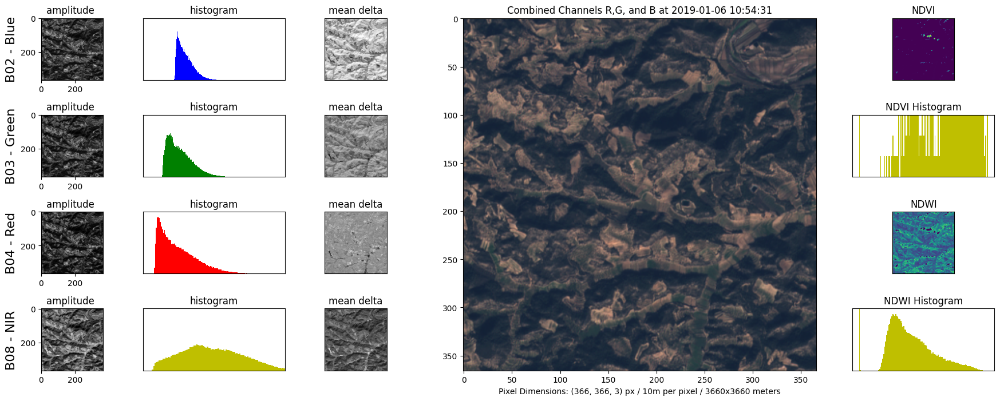

In [702]:
def visualize_patch(patch, time=0):
    B02 = xr.open_dataset(xr.backends.NetCDF4DataStore(patch['B02'])).B02.isel(time=time)
    B03 = xr.open_dataset(xr.backends.NetCDF4DataStore(patch['B03'])).B03.isel(time=time)
    B04 = xr.open_dataset(xr.backends.NetCDF4DataStore(patch['B04'])).B04.isel(time=time)
    B08 = xr.open_dataset(xr.backends.NetCDF4DataStore(patch['B08'])).B08.isel(time=time)
    
    blue8 = np.array((B02 / 16).astype(np.uint8))
    green8 = np.array((B03 / 16).astype(np.uint8))
    red8 = np.array((B04 / 16).astype(np.uint8))
    nir8 = np.array((B08 / 16).astype(np.uint8))
    
    # TODO: make a nested dict
    #bandsdict = {
    #    {'blue':  {'title': 'B02 - Blue',  'band': np.array(B02), 'uint8': blue8,  'plotc': 'b'}},
    #    {'green': {'title': 'B03 - Green', 'band': np.array(B03), 'uint8': green8, 'plotc': 'g'}},
    #    {'red':   {'title': 'B04 - Red',   'band': np.array(B04), 'uint8': red8,   'plotc': 'r'}},
    #    {'nir':   {'title': 'B08 - NIR',   'band': np.array(B08), 'uint8': nir8,   'plotc': 'y'}}
    #}
    
    bands = [
        {'title': 'B02 - Blue',  'band': B02, 'uint8': blue8,  'plotc': 'b'},
        {'title': 'B03 - Green', 'band': B03, 'uint8': green8, 'plotc': 'g'},
        {'title': 'B04 - Red',   'band': B04, 'uint8': red8,   'plotc': 'r'},
        {'title': 'B08 - NIR',   'band': B08, 'uint8': nir8,   'plotc': 'y'}
    ]
    
    bmean = np.mean([np.array(b["band"]) for b in bands], axis=0)
    
    fig = plt.figure(figsize=(18, 7))
    gs = fig.add_gridspec(nrows=len(bands), ncols=5, width_ratios=[2, 2, 2, 6, 2])
    
    xmin = 0
    xmax = np.max(np.concatenate((np.array(B02).flatten(), np.array(B03).flatten(), np.array(B04).flatten())))
    
    ymin = 0
    ymax = 5500
    
    for n,band in enumerate(bands):

        axim1 = fig.add_subplot(gs[n, 0])
        axim1.imshow(band['band'], cmap='gray')
        axim1.set_title('amplitude ')
        axim1.set_ylabel(band['title'], fontsize=16)
    
        ax = fig.add_subplot(gs[n, 1])
        ax.hist(np.array(band['band']).flatten(), bins=128, facecolor=band['plotc'])

        ax.set_title('histogram')
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_ylim((ymin,ymax))
        ax.set_xlim((xmin,xmax))
    
        axim2 = fig.add_subplot(gs[n, 2])
        axim2.imshow(band['band'] - bmean, cmap='gray')
        axim2.set_title('mean delta')
        axim2.set_xticks([])
        axim2.set_yticks([])
    
    NDVI = (B08 - B04) / (B08 + B04)
    ax_ndvi = fig.add_subplot(gs[0, -1])
    ax_ndvi.imshow(np.array(NDVI))
    ax_ndvi.set_title('NDVI')
    ax_ndvi.set_xticks([])
    ax_ndvi.set_yticks([])
    
    ax_ndvi_h = fig.add_subplot(gs[1, -1])
    ax_ndvi_h.hist(np.array(NDVI).flatten(), bins=128, facecolor=band['plotc'])
    ax_ndvi_h.set_title('NDVI Histogram')
    ax_ndvi_h.set_ylim((0, 3))
    ax_ndvi_h.set_xticks([])
    ax_ndvi_h.set_yticks([])
    
    NDWI = (B03 - B08) / (B03 + B08)
    ax_ndwi = fig.add_subplot(gs[2, -1])
    ax_ndwi.imshow(NDWI)
    ax_ndwi.set_title('NDWI')
    ax_ndwi.set_xticks([])
    ax_ndwi.set_yticks([])
    
    ax_ndwi_h = fig.add_subplot(gs[3, -1])
    ax_ndwi_h.hist(np.array(NDWI).flatten(), bins=128, facecolor=band['plotc'])
    ax_ndwi.set_title('NDWI')
    ax_ndwi_h.set_title('NDWI Histogram')
    ax_ndwi_h.set_ylim((0, 3500))
    ax_ndwi_h.set_xticks([])
    ax_ndwi_h.set_yticks([])
    
    axim = fig.add_subplot(gs[:, 3])
    rgb3 = np.dstack((red8, green8, blue8))
    axim.imshow(rgb3)
    #print(f'{band["band"].time}')
    band_time = band['band'].time.dt.isocalendar()
    #print(f'band_time type: {type(band_time)}')
    #print(f'band_time items: {str(band_time.to_dict())}')
    band_dict = band_time.to_dict()
    #print(f'band_dict_coords: {band_dict["coords"]}')
    #print(f'band_dict_coords_data: {band_dict["coords"].keys()}')
    #print(f'band_dict_coords_time: {band_dict["coords"]["time"]}')
    #print(f'band_dict_coords_time_data: {band_dict["coords"]["time"]["data"]}')
    axim.set_title('Combined Channels R,G, and B at ' + str(band_dict["coords"]["time"]["data"]))
    axim.set_xlabel(f'Pixel Dimensions: {rgb.shape} px / 10m per pixel / {rgb.shape[0]*10}x{rgb.shape[1]*10} meters')
    #axim.set_xlabel(f'Pixel Dimensions: {rgb.shape} px / 10m per pixel / {band_dict["coords"]["time"]["data"]} meters')
    
    fig.tight_layout()
    fig.subplots_adjust(wspace=0)
    
    plt.show()

visualize_patch(patch, time=0)

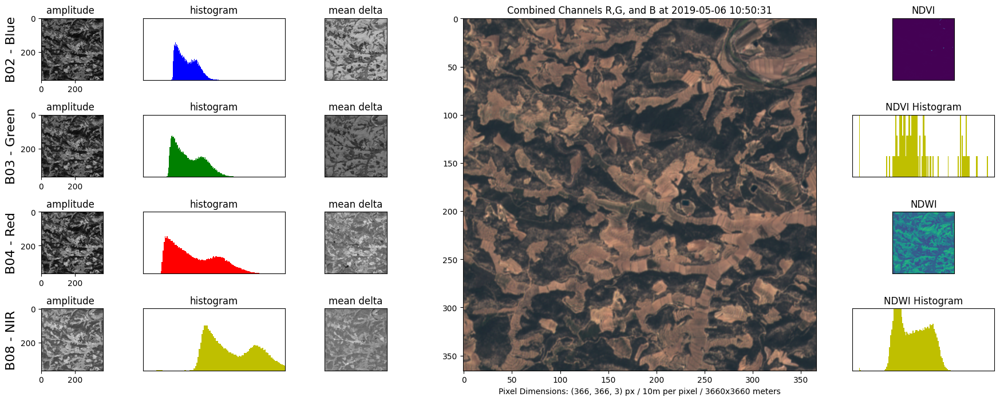

In [703]:
visualize_patch(patch, time=4)

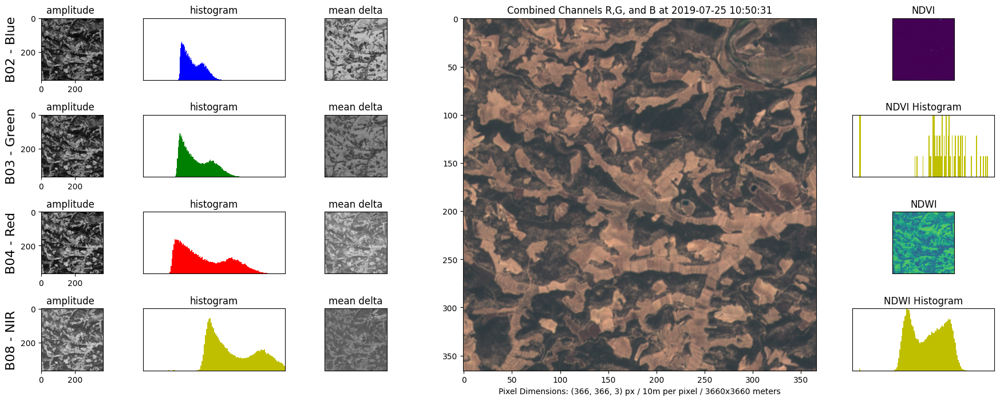

In [704]:
visualize_patch(patch, time=8)

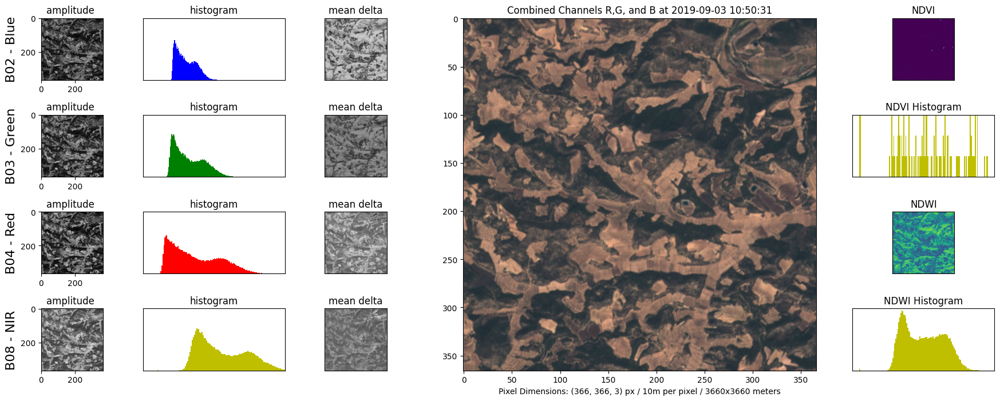

In [705]:
visualize_patch(patch, time=12)

In [706]:
B02.x

<xarray.DataArray 'x' (x: 366)> Size: 3kB
array([262205., 262215., 262225., ..., 265835., 265845., 265855.])
Coordinates:
    band     int64 8B ...
  * x        (x) float64 3kB 2.622e+05 2.622e+05 ... 2.658e+05 2.659e+05
    time     datetime64[ns] 8B 2019-01-06T10:54:31

In [707]:
type(B02)

xarray.core.dataarray.DataArray

In [350]:
type(B02.x)

xarray.core.dataarray.DataArray

In [356]:
type(B02.x.dims)

tuple

In [364]:
print(B02.y.dims)

('y',)


## Now Add the NDVI Index to this

['B02 - Blue', 'B03 - Green', 'B04 - Red', 'B08 - NIR']
(366, 366), float64
xlim: 0 - 3827


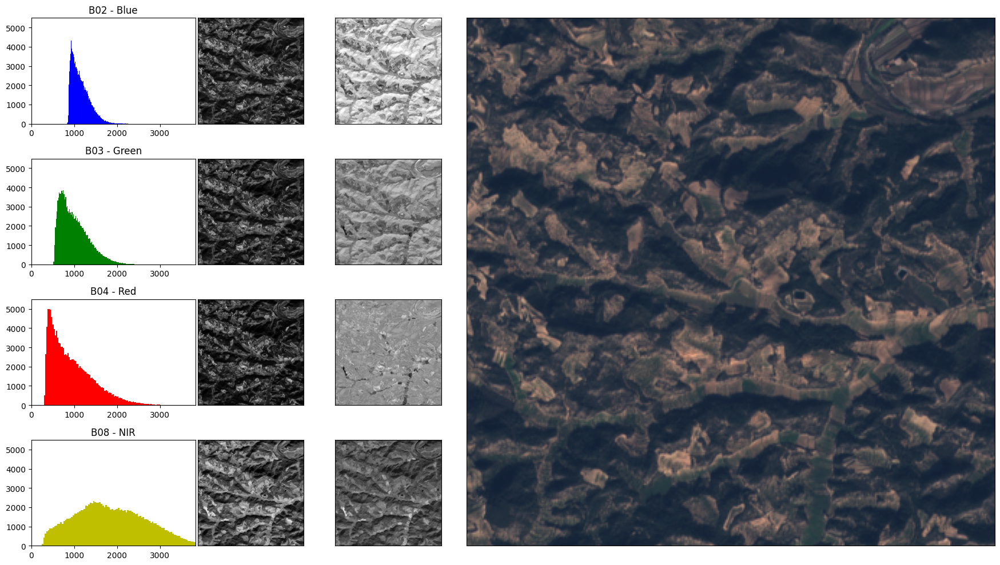

In [365]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
import numpy as np

B02 = xr.open_dataset(xr.backends.NetCDF4DataStore(patch['B02'])).B02.isel(time=0)
B03 = xr.open_dataset(xr.backends.NetCDF4DataStore(patch['B03'])).B03.isel(time=0)
B04 = xr.open_dataset(xr.backends.NetCDF4DataStore(patch['B04'])).B04.isel(time=0)
B08 = xr.open_dataset(xr.backends.NetCDF4DataStore(patch['B08'])).B08.isel(time=0)

bands = [
    {'title': 'B02 - Blue',  'band': B02, 'plotc': 'b'},
    {'title': 'B03 - Green', 'band': B03, 'plotc': 'g'},
    {'title': 'B04 - Red',   'band': B04, 'plotc': 'r'},
    {'title': 'B08 - NIR',   'band': B08, 'plotc': 'y'}
]

print(f'{[b["title"] for b in bands]}')
bmean = np.mean([np.array(b["band"]) for b in bands], axis=0)
print(f'{bmean.shape}, {bmean.dtype}')

fig = plt.figure(figsize=(18, 10))
gs = fig.add_gridspec(nrows=len(bands), ncols=4, width_ratios=[2, 2, 2, 7])

xmin = 0
xmax = np.max(np.concatenate((np.array(B02).flatten(), np.array(B03).flatten(), np.array(B04).flatten())))
print(f'xlim: {xmin} - {xmax}')

ymin = 0
ymax = 5500

for n,band in enumerate(bands):
    ax = fig.add_subplot(gs[n, 0])
    ax.hist(np.array(band['band']).flatten(), bins=128, facecolor=band['plotc'])
    #ax.hist(blue8.astype("float32").flatten(), bins=100, facecolor='b')
    ax.set_title(band['title'])
    #ax.set_xticks([])
    #ax.set_yticks([])
    ax.set_ylim((ymin,ymax))
    ax.set_xlim((xmin,xmax))

    axim = fig.add_subplot(gs[n, 1])
    axim.imshow(band['band'], cmap='gray')
    axim.set_xticks([])
    axim.set_yticks([])

    axim = fig.add_subplot(gs[n, 2])
    axim.imshow(band['band'] - bmean, cmap='gray')
    axim.set_xticks([])
    axim.set_yticks([])

red8 = np.array((B04 / 16).astype(np.uint8))
green8 = np.array((B03 / 16).astype(np.uint8))
blue8 = np.array((B02 / 16).astype(np.uint8))

axim = fig.add_subplot(gs[:, -1])
rgb3 = np.dstack((red8, green8, blue8))
axim.imshow(rgb3)
axim.set_xticks([])
axim.set_yticks([])

fig.tight_layout()
fig.subplots_adjust(wspace=-0.1)

plt.show()

(133956,) uint8
[61 62 73 67 71 85 98 78 74 67]


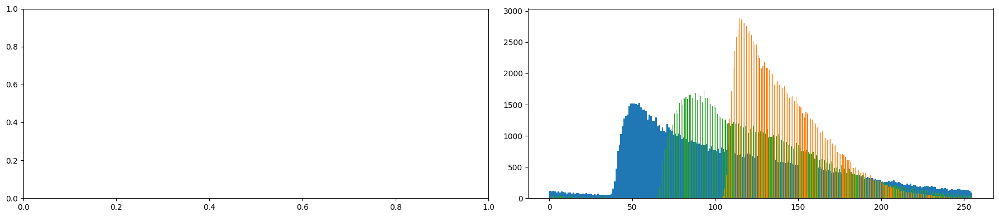

In [119]:
flatred = fRed.flatten()
print(flatred.shape, flatred.dtype)
print(flatred[0:10])

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(18, 4))
plt.hist([fRed.flatten()], bins=256)
plt.hist([fBlue.flatten(), fGreen.flatten()], bins=256)

#for n,ax in enumerate(axes):
#    ax.axes.get_xaxis().set_ticklabels([])
#    ax.axes.get_yaxis().set_ticklabels([])
#    ax.axes.axis('tight')
#    ax.set_xlabel('')
#    ax.set_ylabel('')
#    ax.set_title(f'Month: {i+1}')

plt.tight_layout()
plt.show()